## Importing well-known Python libraries that will be used in the development of this project.

In [4]:
#import libraries
import os
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split

from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import tensorflow as tsf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense
from tensorflow.keras.utils import to_categorical

from sklearn import metrics
from sklearn.metrics import accuracy_score,precision_score,f1_score,recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_fscore_support as score

import warnings
warnings.filterwarnings('ignore') 

## Body performance multi class classification:
**Objective**:The objective of this project is to classify the body performance and grading into body type catagory, the grade of performance of body is dependent upon  age and some exercise performance data.

The dataset is taken from dataset repository of Kaggle
https://www.kaggle.com/datasets/kukuroo3/body-performance-data

In [7]:
#load dataset
__file__ = 'bodyPerformance.csv'
df=pd.read_csv(os.path.join(os.getcwd(), __file__))
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [5]:
#Checking the size of the given dataset.
print("The given data is of shape ",df.shape)

The given data is of shape  (13393, 12)


In [6]:
#checking information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


**Experiment** :

The above cell method prints the information about the DataFrame. The information contains the number of columns, column labels, column data types, memory usage, range index, and the number of cells in each column (non-null values).

**Observation**:

Gender and class columns are of object type that need encoding to get converted into numerical form.

In [7]:
#function to convert object type to numeric type
def object_to_numeric(data):
  s={}
  index=0
  for i in df[data]:
    if i not in s:
      s[i]=index
      index=index+1
  df[data]=df[data].map(s)

#object type features in the data
obj_list=['gender','class']  

#function is called to covert object datatype to numeric datatype
for j in obj_list:
    object_to_numeric(j)

**Experiment**:

The above function maps the object type to integer type.
you can see the difference in the below cell since all object type columns are converted to float and int type


In [8]:
#checking the information of datatype after conversion
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  int64  
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  int64  
dtypes: float64(10), int64(2)
memory usage: 1.2 MB


##Exploratory Data Analysis

<AxesSubplot:xlabel='gender', ylabel='age'>

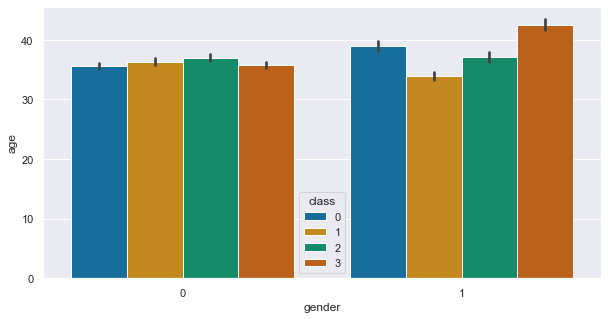

In [9]:
#gender vs age
sns.set(rc = {'figure.figsize':(10,5)})
sns.barplot(x='gender',y='age',data=df,hue='class',palette="colorblind")

Barplot between age and gender and are differentiated by target classes

**Observation**:

1)Male age is between 30-40 

2)Female age is above 30

3)clear observation of age of different classes with respect to gender can be seen.



<AxesSubplot:xlabel='gender', ylabel='height_cm'>

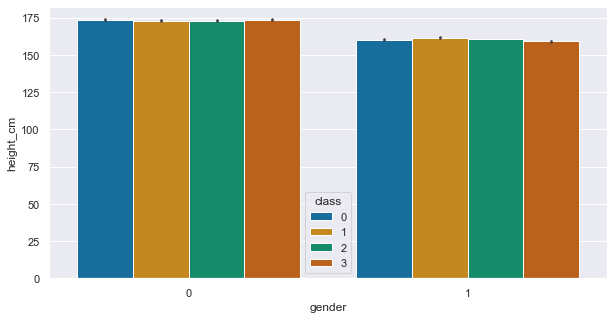

In [10]:
#gender vs height
sns.set(rc = {'figure.figsize':(10,5)})
sns.barplot(x='gender',y='height_cm',data=df,hue='class', palette="colorblind",dodge=True)

Barplot between height and gender and are differentiated by target classes

**Observation**:

1) Male height is above 150 and below 175 centimeter 

2) female height is  below 160 centimeter

3)Clear observation of height of different classes with respect to height in cm can be seen.


<AxesSubplot:xlabel='gender', ylabel='weight_kg'>

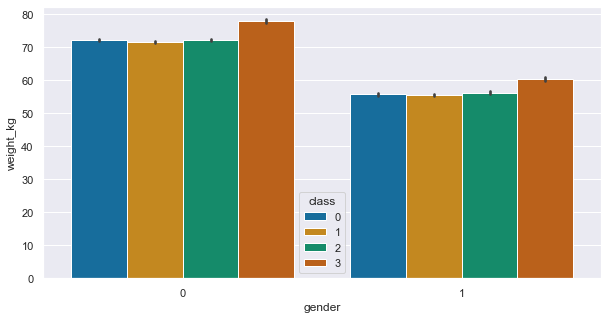

In [11]:
#gender vs weight
sns.set(rc = {'figure.figsize':(10,5)})
sns.barplot(x='gender',y='weight_kg',data=df,hue='class',palette="colorblind")

Barplot between weight in kg and gender and are differentiated by target classes

**Observation**:

1)male weight is above 70kg

2)female weight is  below 60kg

3)Clear observation of weight of different classes with respect to weight in kg can be seen.


<AxesSubplot:xlabel='gender', ylabel='body fat_%'>

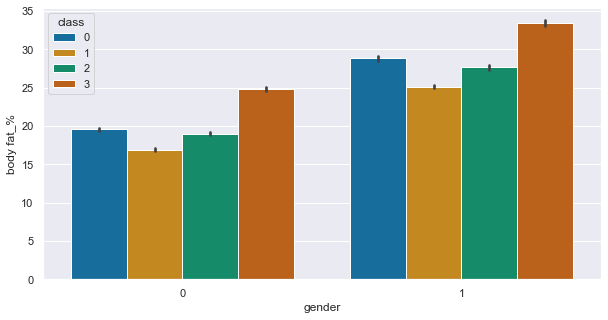

In [12]:
#gender vs body fat
sns.set(rc = {'figure.figsize':(10,5)})
sns.barplot(x='gender',y='body fat_%',data=df,hue='class',palette="colorblind")

Barplot between body and gender and are differentiated by target classes

**Observation**:

1) Male bodyfat is less than 25 percent

2) female bodyfat is greater than equal to 25 percent

3)Clear observation of bodyfat of different classes with respect to fat in % can be seen.


<AxesSubplot:title={'center':'countplot'}, xlabel='class', ylabel='count'>

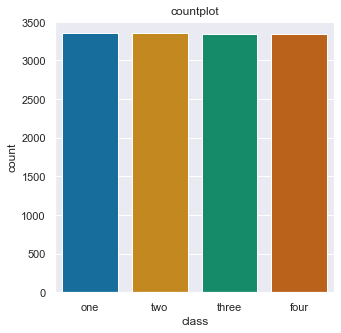

In [13]:
#count plot of fetal health
sns.set(rc = {'figure.figsize':(5,5)})
plt.title("countplot")
plt.xlabel("class")
plt.ylabel("count")
one,two,three,four=df['class'].value_counts()
sns.barplot(x=["one","two","three","four"],y=[one,two,three,four],palette="colorblind")


The countplot above shows number of values of each label in the column. The main objective behind the plot is to check whether the data is balanced or imbalanced

**Observation**:

 The obseravtion shows count of each label are equal, hence dataset is balanced.

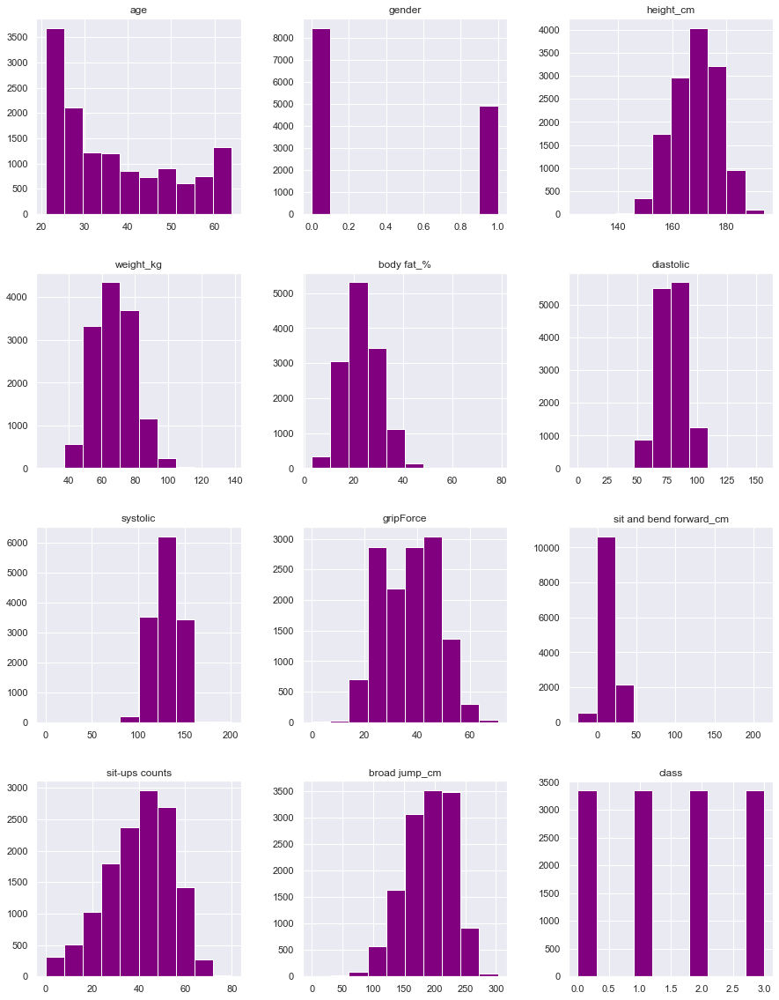

In [14]:
#Observing frequency of features
hist=df.hist(figsize=[15,20],color="purple")

Histogram represents the distribution of a continuous variable over a given interval or period of time by this we can figure out the values within the bins in each column for comparitive study

**Observation**

1)sit-ups counts,broad jump_cm,height_cm,weight_kg columns has  Binomial distribution 

2)Age has Exponential distribution

3)Gripforce has Probability Distributions

<AxesSubplot:>

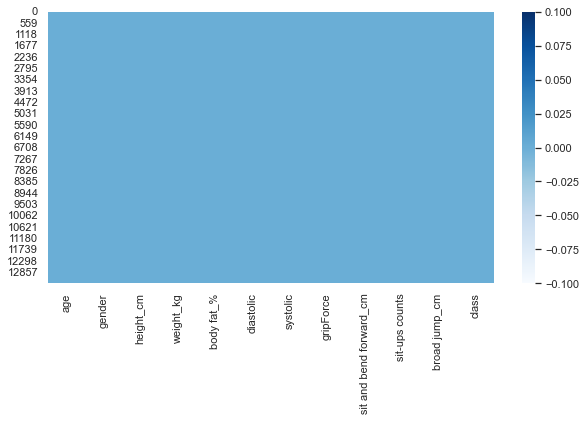

In [15]:
#check for null values
sns.set(rc = {'figure.figsize':(10,5)})
sns.heatmap(df.isnull(),cmap="Blues")

Heatmap plotted above represents that if null values present or not, if there null value are present then we have to resolve it by either droping or applying statistical approach.

**Observation:**

No nan values present in the dataset since no noise can be encountered.





<AxesSubplot:>

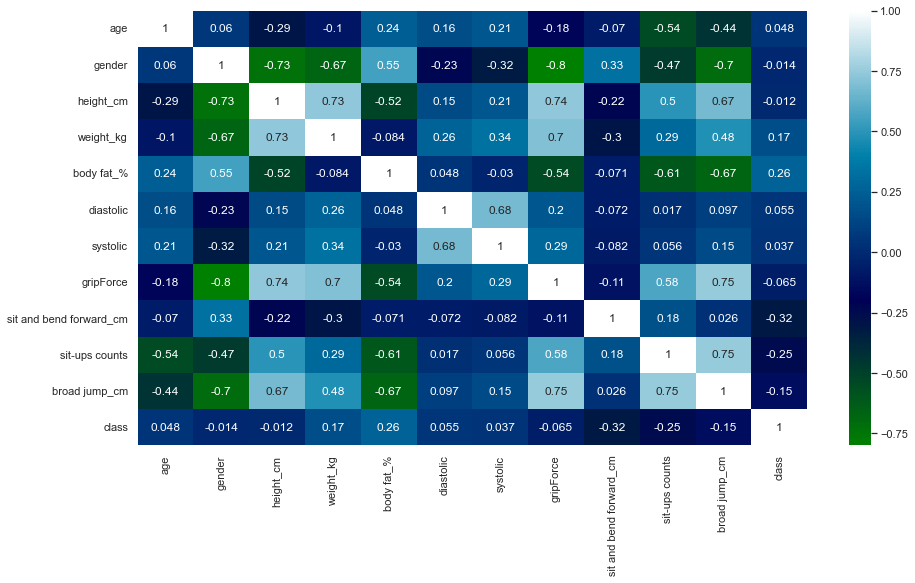

In [16]:
#check correlation of dataset
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df.corr(),annot=True,cmap = 'ocean')

Correlation between all the features have been shown using heatmap. The lighter the color the more it is correlated.

**Observation**

Correlation matrix represented using heatmap shows correlation between dependent and independent variables also among each other. Variables are not much correlated as can be observed through their magnitude hence, it would not cause complexity in the model.

In [17]:
#printing all values which are highly correlated
list_column=list(df.columns)
new_list=[]
for i in list_column:
  if(df['class'].corr(df[i])>0):
    new_list.append(i)
new_list 

['age', 'weight_kg', 'body fat_%', 'diastolic', 'systolic', 'class']

**Objective**

Printing all the features that are highly correlated with the with other features so that we can check the type of relation they have and decide whether to ignore the collinearity or remove it.


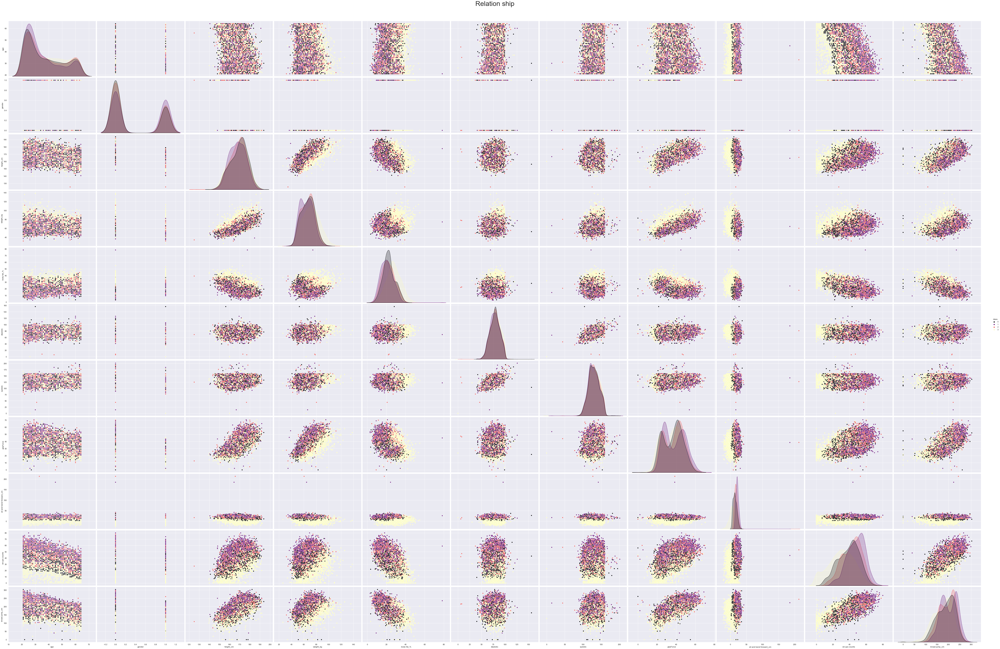

In [18]:
#Pair-wise plotting features
sns.set(font_scale=3)
sns.set(rc = {'figure.figsize':(10,8)})
g = sns.pairplot(df, hue="class", height=5, aspect=1.5, palette='magma')
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Relation ship', fontsize=40)
plt.show()

The pattern of scatter plot indicates the relationship between variables.The relationship can be linear or non-linear.
Scatter plot shows the relationship between two variable but does not indicates the strength of relationship

**Observation**:

1)the above plot tells the correlation among all the independent features, checking correlation will help in using most significant features to avoid high dimentionality, many of features have less correlation for example, correlation between systolic and weight_kg,diastolic and weight_kg.

2)we are using all features since all features are relevant

3) this plot also helps in determining the outliers if any.

<AxesSubplot:>

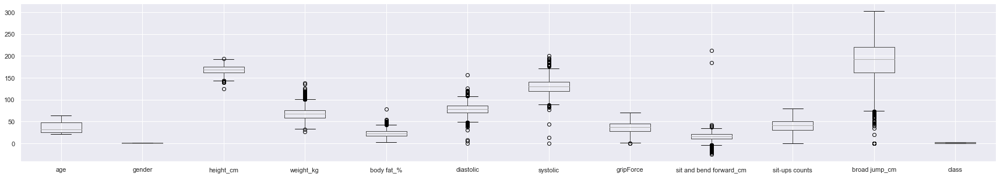

In [19]:
#checking for outliers, if any
df.boxplot(figsize=[30,5])

**Observation**

from the given plot we can observe that there are 8 columns(height_cm,weigh_cm,body_fat,diastolic,sit and bend forward,broad jump) that contain outliers but analysis shows that the outliers are not too far from the quantiles therefore, these may not reply on model performance.

In [20]:
#selecting the dependent and in dependent features
df=df.astype(int)
x=df.iloc[:,:11]
y=df['class']

In [21]:
#Standard Scaling
Scaler = StandardScaler()
x_scaled = Scaler.fit_transform(x)
x_scaled=pd.DataFrame(x_scaled)

Standard scalar is used to standardize the feature values upto a certain range.

**Result**

The data is scaled/standardize and outliers have been scaled too.

In [22]:
#split the data into train and test
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.1,random_state=42,shuffle=True)

##Model Fitting

**Support Vector Machine**

In [23]:
#Support vector machine classifier training
svc = svm.SVC(gamma=0.1 ,C=1,random_state=42)
svc.fit(x_train,y_train)

#accuracy 
svc_acc=accuracy_score(y_test,svc.predict(x_test))

In [24]:
#accuracy on test data
svc_acc=accuracy_score(y_test,svc.predict(x_test))
print(svc_acc*100,"%")

70.8955223880597 %


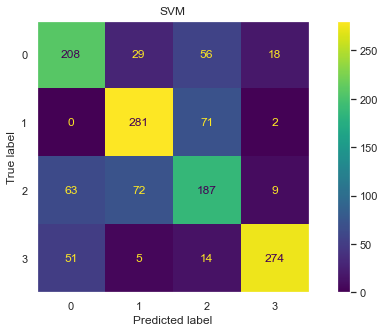

In [25]:
#Confusion matrix
cm = confusion_matrix(y_test,svc.predict(x_test), labels=svc.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svc.classes_)
sns.set(rc = {'figure.figsize':(10,5)})
disp.plot()
plt.title('SVM')
plt.grid(False)
plt.show()

In [26]:
#classfication report
print("REPORT FOR SVM\n")
print(classification_report(y_test,svc.predict(x_test)))

#precision,recall and F-1 score 
svc_precision = metrics.precision_score(y_test,svc.predict(x_test), average='weighted', labels=np.unique(svc.predict(x_test)))
print("svc_precision", svc_precision)
svc_recall = metrics.recall_score(y_test,svc.predict(x_test), average='weighted', labels=np.unique(svc.predict(x_test)))
print("svc_recall:",svc_recall)
f1_svc = metrics.f1_score(y_test,svc.predict(x_test), average='weighted', labels=np.unique(svc.predict(x_test)))
print("svc_f1_score: ",f1_svc)

REPORT FOR SVM

              precision    recall  f1-score   support

           0       0.65      0.67      0.66       311
           1       0.73      0.79      0.76       354
           2       0.57      0.56      0.57       331
           3       0.90      0.80      0.85       344

    accuracy                           0.71      1340
   macro avg       0.71      0.71      0.71      1340
weighted avg       0.71      0.71      0.71      1340

svc_precision 0.7147160022927076
svc_recall: 0.7089552238805971
svc_f1_score:  0.7105117915410911


**Hyperparameter tunnning of decesion tree**





In [27]:
for max_d in range(1,21):

  model = DecisionTreeClassifier(max_depth=max_d, random_state=42)
  model.fit(x_train,y_train)
  print('The Training Accuracy for max_depth {} is:'.format(max_d), accuracy_score(y_train,model.predict(x_train)))
  print('The Validation Accuracy for max_depth {} is:'.format(max_d), accuracy_score(y_test,model.predict(x_test)))
  print('')

The Training Accuracy for max_depth 1 is: 0.38488343151082716
The Validation Accuracy for max_depth 1 is: 0.4014925373134328

The Training Accuracy for max_depth 2 is: 0.471251970463785
The Validation Accuracy for max_depth 2 is: 0.48208955223880595

The Training Accuracy for max_depth 3 is: 0.537791421222932
The Validation Accuracy for max_depth 3 is: 0.5604477611940298

The Training Accuracy for max_depth 4 is: 0.5552144694266987
The Validation Accuracy for max_depth 4 is: 0.5813432835820895

The Training Accuracy for max_depth 5 is: 0.5920517713432341
The Validation Accuracy for max_depth 5 is: 0.6149253731343284

The Training Accuracy for max_depth 6 is: 0.6168588733095495
The Validation Accuracy for max_depth 6 is: 0.6447761194029851

The Training Accuracy for max_depth 7 is: 0.649298929727039
The Validation Accuracy for max_depth 7 is: 0.6492537313432836

The Training Accuracy for max_depth 8 is: 0.6880444702563677
The Validation Accuracy for max_depth 8 is: 0.6753731343283582

T

**Objective**:

To get best parameters for decision tree model to improve model performance

**Decision Tree**

In [28]:
#creating decision tree object
dcf= DecisionTreeClassifier(max_depth=10, random_state=42)

#train the decision tree model
dcf.fit(x_train,y_train)

#checking test accuracy
dcf_acc=accuracy_score(y_test,dcf.predict(x_test))
print(dcf_acc*100,"%")

72.38805970149254 %


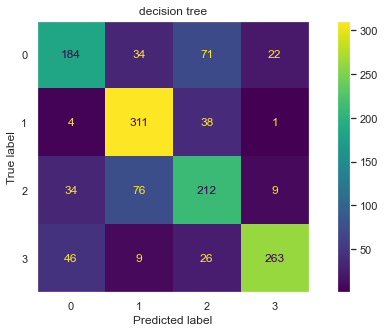

In [29]:
#plot confusion matrix
cm = confusion_matrix(y_test,dcf.predict(x_test), labels=dcf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dcf.classes_)
sns.set(rc = {'figure.figsize':(10,5)})
disp.plot()
plt.title('decision tree')
plt.grid(False)
plt.show()

In [30]:
#classfication report
print("REPORT FOR Decesiontree\n")
print(classification_report(y_test,dcf.predict(x_test)))

#precision,recall and F-1 score for rf
dcf_precision = metrics.precision_score(y_test,dcf.predict(x_test), average='weighted', labels=np.unique(dcf.predict(x_test)))
print("dcf_precision:", dcf_precision)
dcf_recall = metrics.recall_score(y_test,dcf.predict(x_test), average='weighted', labels=np.unique(dcf.predict(x_test)))
print("dcf_recall:",dcf_recall)
dcf_f1 = metrics.f1_score(y_test,dcf.predict(x_test), average='weighted', labels=np.unique(dcf.predict(x_test)))
print("F1_score_dcf: ",dcf_f1)

REPORT FOR Decesiontree

              precision    recall  f1-score   support

           0       0.69      0.59      0.64       311
           1       0.72      0.88      0.79       354
           2       0.61      0.64      0.63       331
           3       0.89      0.76      0.82       344

    accuracy                           0.72      1340
   macro avg       0.73      0.72      0.72      1340
weighted avg       0.73      0.72      0.72      1340

dcf_precision: 0.7301973700176266
dcf_recall: 0.7238805970149254
F1_score_dcf:  0.7228966266074993


**Random Forest Classifier**

In [31]:
#random forest object
rf=RandomForestClassifier()
rf.fit(x_train,y_train)

#accuracy on test data
rf_acc=accuracy_score(y_test,rf.predict(x_test))
print(rf_acc*100,"%")

76.34328358208955 %


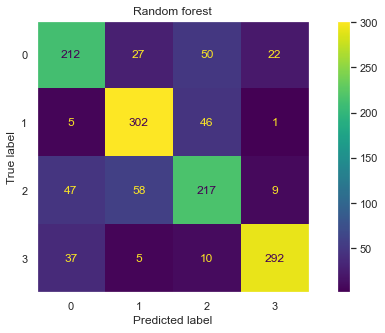

In [32]:
#plot confusion matrix
cm = confusion_matrix(y_test,rf.predict(x_test), labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_)
sns.set(rc = {'figure.figsize':(10,5)})
disp.plot()
plt.title('Random forest')
plt.grid(False)
plt.show()

In [33]:
#classfication report
print("REPORT FOR RandomForestClassifier\n")
print(classification_report(y_test,rf.predict(x_test)))

#precision,recall and F-1 score for rf
rf_precision = metrics.precision_score(y_test,rf.predict(x_test), average='weighted', labels=np.unique(rf.predict(x_test)))
print("rf_precision:", rf_precision)
rf_recall = metrics.recall_score(y_test,rf.predict(x_test), average='weighted', labels=np.unique(rf.predict(x_test)))
print("rf_recall:",rf_recall)
rf_f1 = metrics.f1_score(y_test,rf.predict(x_test), average='weighted', labels=np.unique(rf.predict(x_test)))
print("F1_score_rf: ",rf_f1)

REPORT FOR RandomForestClassifier

              precision    recall  f1-score   support

           0       0.70      0.68      0.69       311
           1       0.77      0.85      0.81       354
           2       0.67      0.66      0.66       331
           3       0.90      0.85      0.87       344

    accuracy                           0.76      1340
   macro avg       0.76      0.76      0.76      1340
weighted avg       0.76      0.76      0.76      1340

rf_precision: 0.7643037190491119
rf_recall: 0.7634328358208955
F1_score_rf:  0.763043002606209


**Artificial neural networks**

In [34]:
#one hot encoding 
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

#neural network object
model=Sequential()

#building neural network
model.add(Dense(10,activation='relu',input_dim=11,kernel_initializer='glorot_uniform'))
model.add(Dense(7,activation='relu',kernel_initializer='glorot_uniform'))
model.add(Dense(5,activation='relu'))
model.add(Dense(3,activation='tanh'))
model.add(Dense(4,activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#training neural network
history = model.fit(x_train,y_train,epochs=100,batch_size=100)


Epoch 1/100
121/121 [==============================] - 5s 7ms/step - loss: 1.3887 - accuracy: 0.2669
Epoch 2/100
121/121 [==============================] - 1s 6ms/step - loss: 1.3392 - accuracy: 0.3054
Epoch 3/100
121/121 [==============================] - 1s 6ms/step - loss: 1.1808 - accuracy: 0.4507
Epoch 4/100
121/121 [==============================] - 1s 7ms/step - loss: 1.0666 - accuracy: 0.4705
Epoch 5/100
121/121 [==============================] - 0s 4ms/step - loss: 0.9989 - accuracy: 0.5468
Epoch 6/100
121/121 [==============================] - 1s 5ms/step - loss: 0.9502 - accuracy: 0.5721
Epoch 7/100
121/121 [==============================] - 1s 8ms/step - loss: 0.9108 - accuracy: 0.6029
Epoch 8/100
121/121 [==============================] - 1s 6ms/step - loss: 0.8775 - accuracy: 0.6224
Epoch 9/100
121/121 [==============================] - 1s 5ms/step - loss: 0.8512 - accuracy: 0.6317
Epoch 10/100
121/121 [==============================] - 0s 4ms/step - loss: 0.8294 - accura

In [35]:
#check accuracy score for neural network model on test data.
loss,accuracy=model.evaluate(x_test, y_test)

42/42 [==============================] - 1s 4ms/step - loss: 0.6136 - accuracy: 0.7552


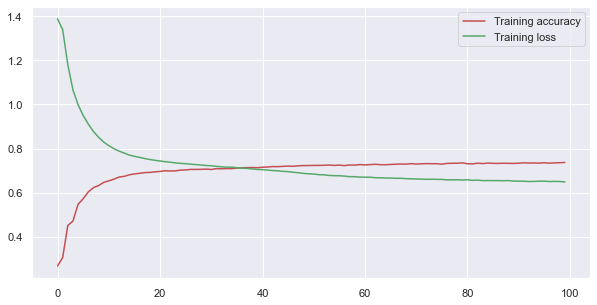

In [36]:
#plotting accuracy and loss to observe how it is changing with increasing epochs.
plt.plot(history.history['accuracy'], label='Training accuracy', c='r')
plt.plot(history.history['loss'],  label='Training loss', c='g')
plt.legend()
plt.show()

## RESULTS

<AxesSubplot:title={'center':'Accuracy'}>

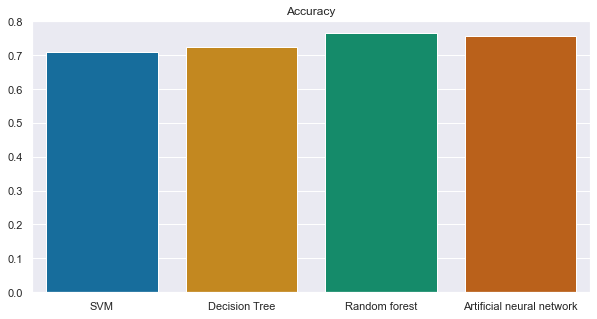

In [37]:
#comparative accuracy barplot for all models
plt.title("Accuracy")
sns.barplot(x=["SVM","Decision Tree","Random forest","Artificial neural network"],y=[svc_acc,dcf_acc,rf_acc,accuracy],palette="colorblind")

The accuracy of RF can be seen outperforming other models. ANN can also been seen coming up with greater score.

<AxesSubplot:title={'center':'precision'}>

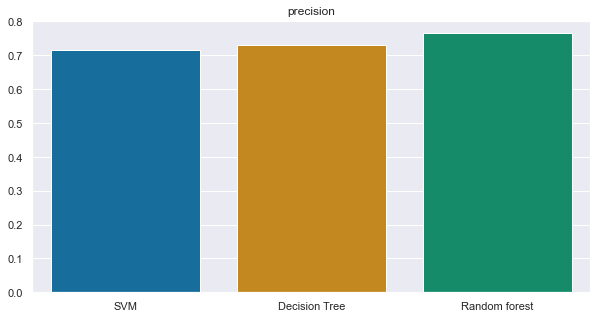

In [38]:
#comparative precision barplot for all models
plt.title("precision")
sns.barplot(x=["SVM","Decision Tree","Random forest",],y=[svc_precision ,dcf_precision,rf_precision ],palette="colorblind")

**observation**:

Precision of Random forest is highest. SVM has least precision score which means it is lagging predicitng positive responses.


<AxesSubplot:title={'center':'recall'}>

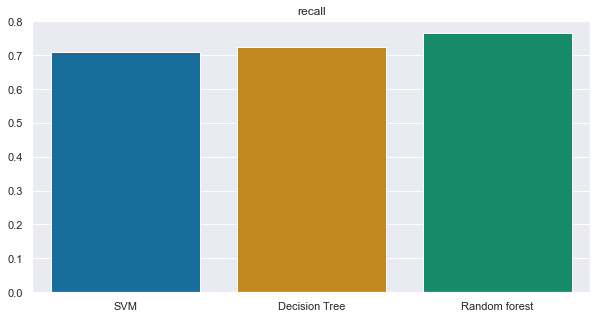

In [39]:
#comparative recall barplot for all models
plt.title("recall")
sns.barplot(x=["SVM","Decision Tree","Random forest",],y=[svc_recall ,dcf_recall,rf_recall ],palette="colorblind")

**observation**:

recall of Random forest and decision tree are highest  whereas SVM is again lagging in terms of prediciting class correclty.


<AxesSubplot:title={'center':'F1-score'}>

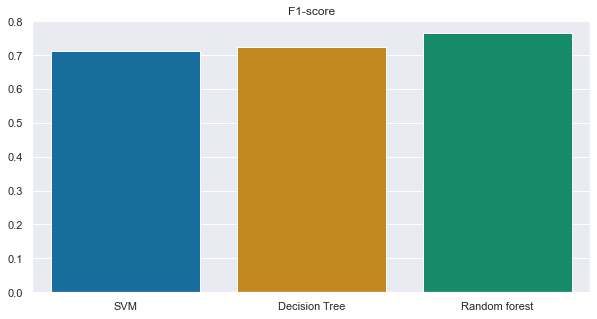

In [40]:
#comparative f1-score barplot for all models
plt.title("F1-score")
sns.barplot(x=["SVM","Decision Tree","Random forest",],y=[f1_svc ,dcf_f1,rf_f1],palette="colorblind")

**observation**:

F1-score of Random forest i greatest followed with decision tree. SVM is still least active in predicting accurately.

### **Result and Observation**:

1)Random Forest Classifer is the best model for this classification with accuracy around 76 percent.

2)Neural Network Model came out to be as the second best model for this classification with accuracy 75 percent.

As the batches are increased in neural network the accuracy increases and log loss decreases accordingly. Hence, it is concluded that efficiency of neural network model can be increased by working on its layers and epoch and batch variations.

Hence, for such dataset or related datasets, Random Forest and Neural Network seem to be more active and accurate.